In [1]:
import matplotlib.pyplot as plt
import seaborn as sns
import os
import matplotlib.patches as mpatches
import pandas as pd
import numpy as np
import tifffile
import pre_process_mm as pre
import mm3_adapted_cell_segmentation as mm3seg
import mm3_adapted_cell_tracking as mm3track
import plot_cells

# Correct for image drift and rotation

In [2]:
# run these late at night, because it will take forever
exp_directories = ['DUMM_giTG62_Glucose_012925', 
               'DUMM_giTG63_giTG67_Glucose_121724_1', 
               'DUMM_giTG66_Glucose_012825_reattempt',
               'DUMM_giTG69_Glucose_013025']

In [12]:
folder_name = 'DUMM_giTG62_Glucose_012925'
root_dir = f'/Users/noravivancogonzalez/Documents/DuMM_image_analysis/{folder_name}'

In [ ]:
drift_corrected_path = pre.drift_correct(root_dir, 'DuMM', c=0)

Estimate drift (relative to frame '0'):  27%|▌ | 49/179 [02:00<05:25,  2.51s/it]

In [ ]:
for folder_name in exp_directories:
    # Specify experiment folder with aquired positions, default output from Covert lab scope's micromanager
    root_dir = f'/Users/noravivancogonzalez/Documents/DuMM_image_analysis/{folder_name}'
    # Privide experiment suffix
    # Indicate phase channel index
    drift_corrected_path = pre.drift_correct(root_dir, 'DuMM', c=0)

In [2]:
folder_name = 'DUMM_giTG62_Glucose_012925'

In [3]:
drift_corrected_path = f'/Users/noravivancogonzalez/Documents/DuMM_image_analysis/{folder_name}/hyperstacked/drift_corrected'

# Remember to change the sign of angle rotation for latest run, which has channels upside down

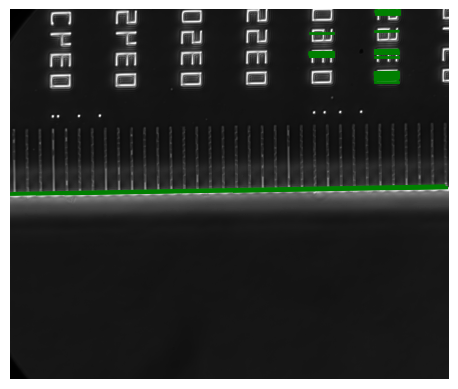

Rotation angle:
-0.5585897195085932


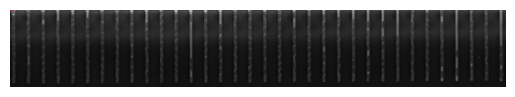

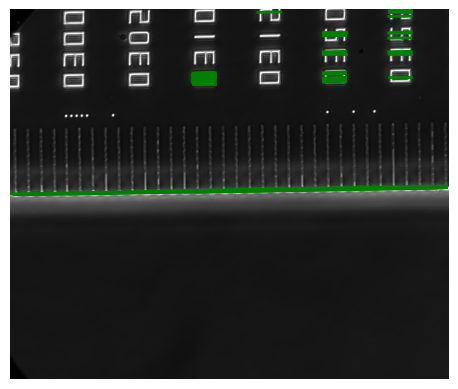

Rotation angle:
-1.0004012720876951


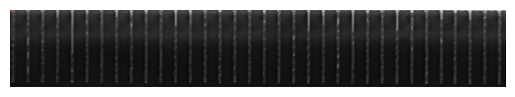

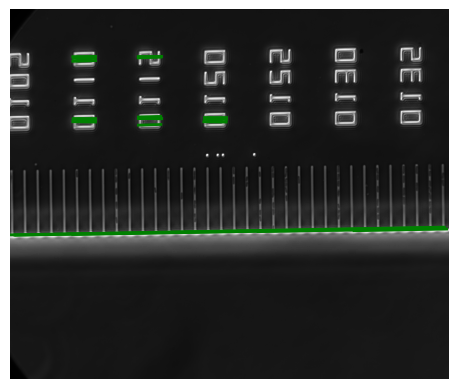

Rotation angle:
-0.8513378874513051


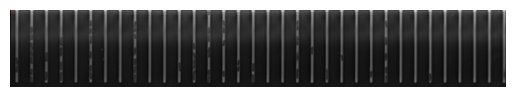

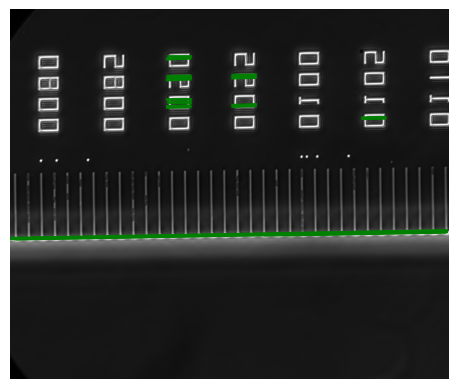

Rotation angle:
-1.2009353873453033


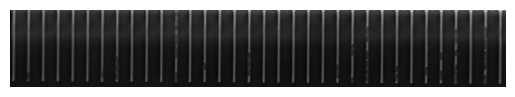

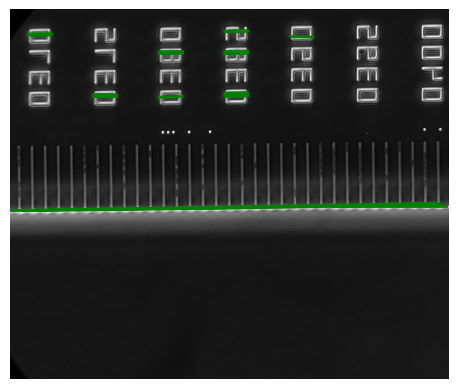

Rotation angle:
-0.851133534083093


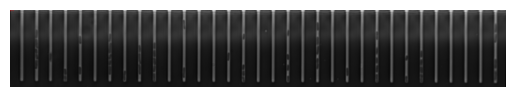

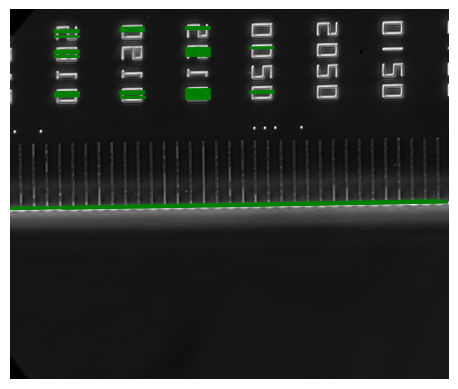

Rotation angle:
-0.7191822800178284


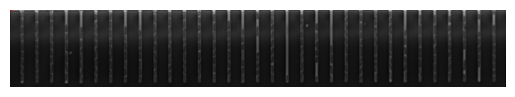

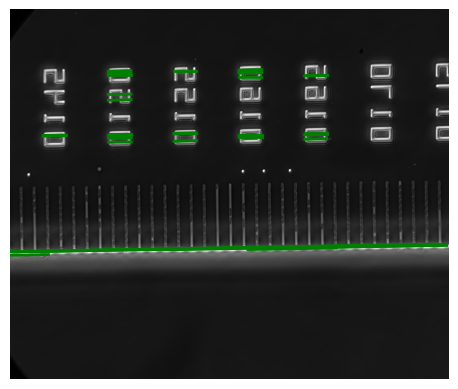

Rotation angle:
-0.8369004380445324


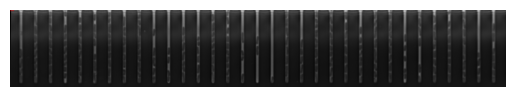

Successfully rotated stack


In [4]:
# Growth channel length depends on # of pixels, measure on image for proper estimation
path_to_rotated_images = pre.rotate_stack(drift_corrected_path, c=0, growth_channel_length=400, closed_ends = 'up')

# Isolate microfluidic channels

channels identified in FOV 009
saving sliced microfluidic channels as tcyx stacks
channels identified in FOV 008
saving sliced microfluidic channels as tcyx stacks
channels identified in FOV 018
saving sliced microfluidic channels as tcyx stacks
channels identified in FOV 019
saving sliced microfluidic channels as tcyx stacks
channels identified in FOV 011
saving sliced microfluidic channels as tcyx stacks
channels identified in FOV 005
saving sliced microfluidic channels as tcyx stacks
channels identified in FOV 004
saving sliced microfluidic channels as tcyx stacks


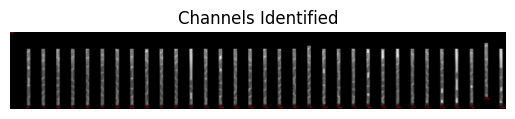

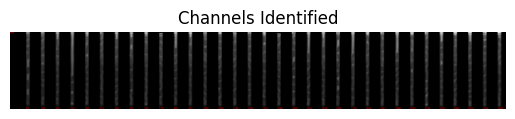

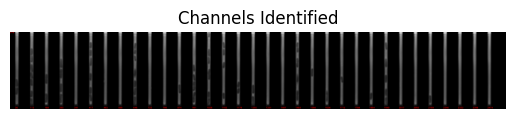

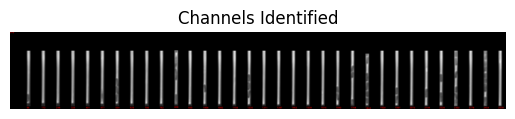

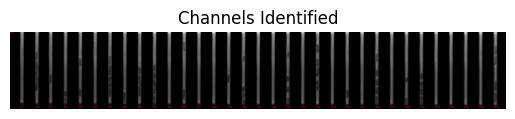

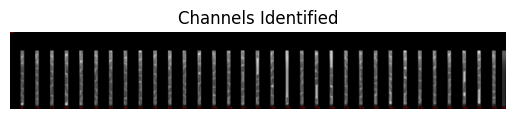

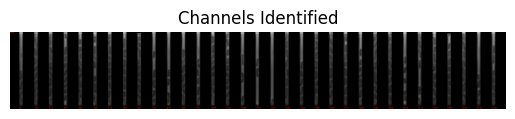

In [5]:
# Separate mother machine channels as individual files
path_to_mm_channels = pre.extract_mm_channels(path_to_rotated_images)

In [ ]:
# There are IDs added to each microfluidic channel identified in the image. 
#These images can be found in the mm_channels subfulder and are labeled
# for example as "FOV001_mm_channel_mask.tif"

folder_name = '20241205'
FOV_dict = {'20241205':
            {
    '006': {'empty_stack_id': '2118','ana_peak_ids' : ['2235']}, 
    '007': {'empty_stack_id': '1552','ana_peak_ids' : ['1093','1666']},
    '008': {'empty_stack_id': '1117','ana_peak_ids' : ['659', '1232', '2494']},
    '009': {'empty_stack_id': '1108', 'ana_peak_ids' : ['1452','1567', '1680', '1795']}
            }
           }

# Subtract background from phase and fluorescent images

In [14]:
folder_name = 'DUMM_giTG62_Glucose_012925'
files_FOV_dict = {'DUMM_giTG62_Glucose_012925': 
            {'005': 
            {'empty_stack_id': '64',
                'ana_peak_ids' : ['367', '445', '825', '900', '977', '1052', '1128', '1201', '1277', 
                                 '1582', '1733', '1810', '1887', '1963', '2039', '2115', '2344', '2421', '2497']},
             '008':
             {'empty_stack_id': '93',
                'ana_peak_ids' : ['703', '779', '855', '931']
             },
            '018':{
                'empty_stack_id':'341',
                'ana_peak_ids' : ['1940', '1483']
            }
            }
           }
                

In [7]:
path_to_mm_channels = f'/Users/noravivancogonzalez/Documents/DuMM_image_analysis/{folder_name}/hyperstacked/drift_corrected/rotated/mm_channels'

In [9]:
folders = [folder_name]

In [ ]:
for folder, FOV_dict in files_FOV_dict.items():
    path_to_mm_channels = f'/Users/noravivancogonzalez/Documents/DuMM_image_analysis/{folder}/hyperstacked/drift_corrected/rotated/mm_channels'
    for FOV in FOV_dict.keys():
        empty_stack_id = FOV_dict[FOV]['empty_stack_id']
        ana_peak_ids = FOV_dict[FOV]['ana_peak_ids']
        pre.subtract_fov_stack(path_to_mm_channels, FOV, empty_stack_id, ana_peak_ids, method = 'phase', channel_index= 0)
        pre.subtract_fov_stack(path_to_mm_channels, FOV, empty_stack_id, ana_peak_ids, method = 'fluor', channel_index= 1)

# Select channels to do cell segmentation

In [3]:
# starting at t= 25 for fov 005, fov 018 starting at t = 0

seg_FOV_dict = {'DUMM_giTG62_Glucose_012925': 
            {'005': ['445', '900', '1128', '1277', '1887',  '2115', '2344', '2421', '2497'],
             '018':['1940', '1483']
            }
           }

# Identify cells in image per microfluidic channel

/Users/noravivancogonzalez/code/Image_analysis_copy/mm3_adapted_cell_segmentation.py:102: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  labeled = morphology.remove_small_objects(labeled, min_size=min_object_size)
/Users/noravivancogonzalez/code/Image_analysis_copy/mm3_adapted_cell_segmentation.py:102: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  labeled = morphology.remove_small_objects(labeled, min_size=min_object_size)


merge regions
merge regions
merge regions
merge regions


/Users/noravivancogonzalez/code/Image_analysis_copy/mm3_adapted_cell_segmentation.py:102: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  labeled = morphology.remove_small_objects(labeled, min_size=min_object_size)
/Users/noravivancogonzalez/code/Image_analysis_copy/mm3_adapted_cell_segmentation.py:102: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  labeled = morphology.remove_small_objects(labeled, min_size=min_object_size)
/Users/noravivancogonzalez/code/Image_analysis_copy/mm3_adapted_cell_segmentation.py:102: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  labeled = morphology.remove_small_objects(labeled, min_size=min_object_size)
/Users/noravivancogonzalez/code/Image_analysis_copy/mm3_adapted_cell_segmentation.py:102: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use 

merge regions
merge regions


/Users/noravivancogonzalez/code/Image_analysis_copy/mm3_adapted_cell_segmentation.py:102: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  labeled = morphology.remove_small_objects(labeled, min_size=min_object_size)
/Users/noravivancogonzalez/code/Image_analysis_copy/mm3_adapted_cell_segmentation.py:102: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  labeled = morphology.remove_small_objects(labeled, min_size=min_object_size)


merge regions
merge regions


/Users/noravivancogonzalez/code/Image_analysis_copy/mm3_adapted_cell_segmentation.py:102: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  labeled = morphology.remove_small_objects(labeled, min_size=min_object_size)
/Users/noravivancogonzalez/code/Image_analysis_copy/mm3_adapted_cell_segmentation.py:102: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  labeled = morphology.remove_small_objects(labeled, min_size=min_object_size)


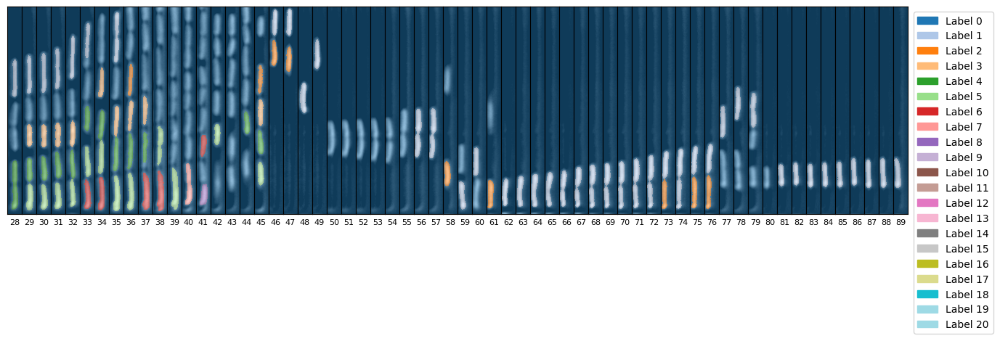

merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions


/Users/noravivancogonzalez/code/Image_analysis_copy/mm3_adapted_cell_segmentation.py:102: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  labeled = morphology.remove_small_objects(labeled, min_size=min_object_size)
/Users/noravivancogonzalez/code/Image_analysis_copy/mm3_adapted_cell_segmentation.py:102: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  labeled = morphology.remove_small_objects(labeled, min_size=min_object_size)
/Users/noravivancogonzalez/code/Image_analysis_copy/mm3_adapted_cell_segmentation.py:102: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  labeled = morphology.remove_small_objects(labeled, min_size=min_object_size)
/Users/noravivancogonzalez/code/Image_analysis_copy/mm3_adapted_cell_segmentation.py:102: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use 

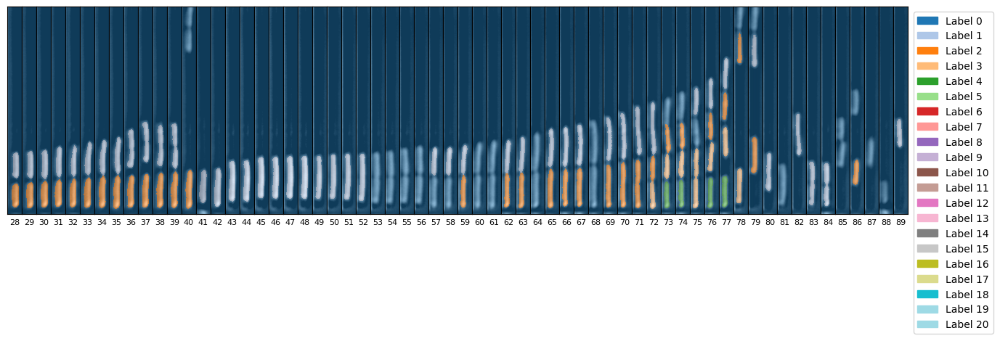

/Users/noravivancogonzalez/code/Image_analysis_copy/mm3_adapted_cell_segmentation.py:102: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  labeled = morphology.remove_small_objects(labeled, min_size=min_object_size)


merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions


/Users/noravivancogonzalez/code/Image_analysis_copy/mm3_adapted_cell_segmentation.py:102: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  labeled = morphology.remove_small_objects(labeled, min_size=min_object_size)
/Users/noravivancogonzalez/code/Image_analysis_copy/mm3_adapted_cell_segmentation.py:102: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  labeled = morphology.remove_small_objects(labeled, min_size=min_object_size)
/Users/noravivancogonzalez/code/Image_analysis_copy/mm3_adapted_cell_segmentation.py:102: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  labeled = morphology.remove_small_objects(labeled, min_size=min_object_size)
/Users/noravivancogonzalez/code/Image_analysis_copy/mm3_adapted_cell_segmentation.py:102: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use 

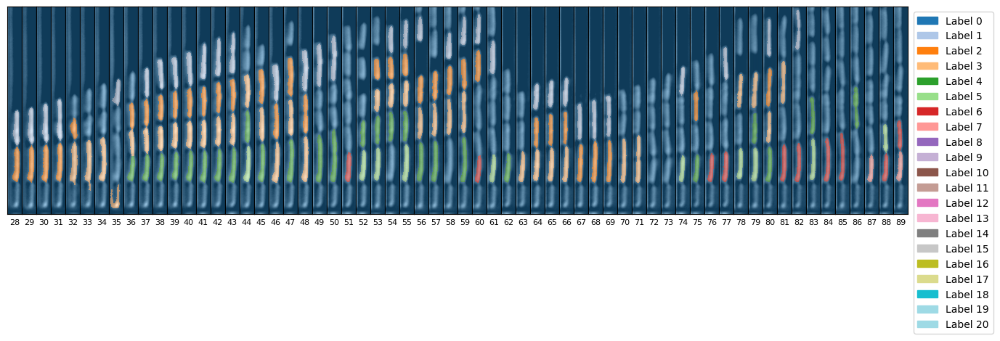

/Users/noravivancogonzalez/code/Image_analysis_copy/mm3_adapted_cell_segmentation.py:102: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  labeled = morphology.remove_small_objects(labeled, min_size=min_object_size)
/Users/noravivancogonzalez/code/Image_analysis_copy/mm3_adapted_cell_segmentation.py:102: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  labeled = morphology.remove_small_objects(labeled, min_size=min_object_size)
/Users/noravivancogonzalez/code/Image_analysis_copy/mm3_adapted_cell_segmentation.py:102: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  labeled = morphology.remove_small_objects(labeled, min_size=min_object_size)
/Users/noravivancogonzalez/code/Image_analysis_copy/mm3_adapted_cell_segmentation.py:102: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use 

merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions


/Users/noravivancogonzalez/code/Image_analysis_copy/mm3_adapted_cell_segmentation.py:102: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  labeled = morphology.remove_small_objects(labeled, min_size=min_object_size)
/Users/noravivancogonzalez/code/Image_analysis_copy/mm3_adapted_cell_segmentation.py:102: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  labeled = morphology.remove_small_objects(labeled, min_size=min_object_size)
/Users/noravivancogonzalez/code/Image_analysis_copy/mm3_adapted_cell_segmentation.py:102: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  labeled = morphology.remove_small_objects(labeled, min_size=min_object_size)
/Users/noravivancogonzalez/code/Image_analysis_copy/mm3_adapted_cell_segmentation.py:102: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use 

merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge 

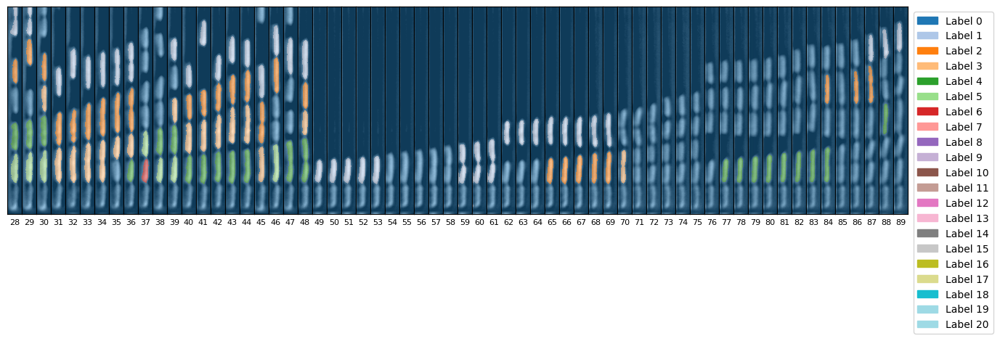

/Users/noravivancogonzalez/code/Image_analysis_copy/mm3_adapted_cell_segmentation.py:102: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  labeled = morphology.remove_small_objects(labeled, min_size=min_object_size)
/Users/noravivancogonzalez/code/Image_analysis_copy/mm3_adapted_cell_segmentation.py:102: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  labeled = morphology.remove_small_objects(labeled, min_size=min_object_size)


merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge 

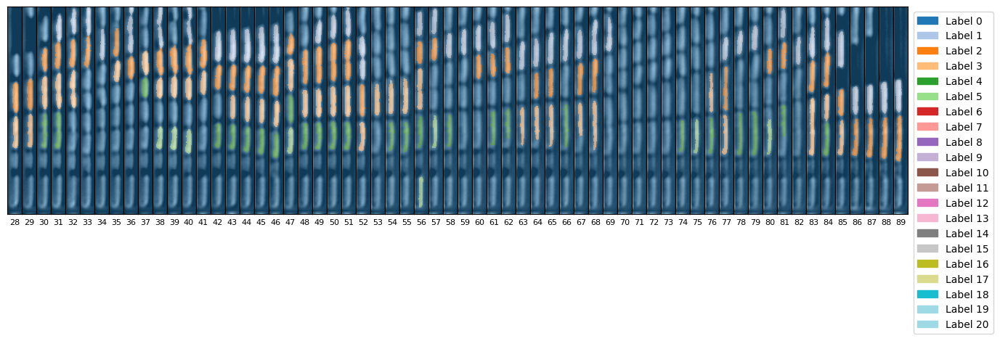

merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions


/Users/noravivancogonzalez/code/Image_analysis_copy/mm3_adapted_cell_segmentation.py:102: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  labeled = morphology.remove_small_objects(labeled, min_size=min_object_size)
/Users/noravivancogonzalez/code/Image_analysis_copy/mm3_adapted_cell_segmentation.py:102: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  labeled = morphology.remove_small_objects(labeled, min_size=min_object_size)
/Users/noravivancogonzalez/code/Image_analysis_copy/mm3_adapted_cell_segmentation.py:102: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  labeled = morphology.remove_small_objects(labeled, min_size=min_object_size)
/Users/noravivancogonzalez/code/Image_analysis_copy/mm3_adapted_cell_segmentation.py:102: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use 

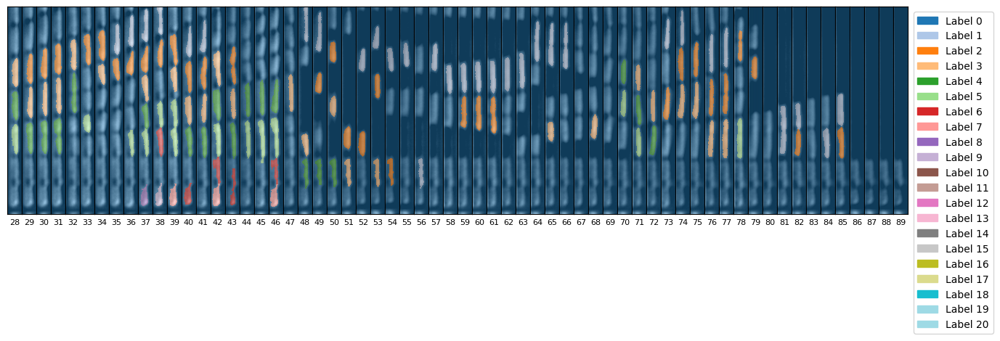

/Users/noravivancogonzalez/code/Image_analysis_copy/mm3_adapted_cell_segmentation.py:102: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  labeled = morphology.remove_small_objects(labeled, min_size=min_object_size)


merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions


/Users/noravivancogonzalez/code/Image_analysis_copy/mm3_adapted_cell_segmentation.py:102: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  labeled = morphology.remove_small_objects(labeled, min_size=min_object_size)
/Users/noravivancogonzalez/code/Image_analysis_copy/mm3_adapted_cell_segmentation.py:102: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  labeled = morphology.remove_small_objects(labeled, min_size=min_object_size)


merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions


/Users/noravivancogonzalez/code/Image_analysis_copy/mm3_adapted_cell_segmentation.py:102: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  labeled = morphology.remove_small_objects(labeled, min_size=min_object_size)
/Users/noravivancogonzalez/code/Image_analysis_copy/mm3_adapted_cell_segmentation.py:102: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  labeled = morphology.remove_small_objects(labeled, min_size=min_object_size)
/Users/noravivancogonzalez/code/Image_analysis_copy/mm3_adapted_cell_segmentation.py:102: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  labeled = morphology.remove_small_objects(labeled, min_size=min_object_size)
/Users/noravivancogonzalez/code/Image_analysis_copy/mm3_adapted_cell_segmentation.py:102: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use 

merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions


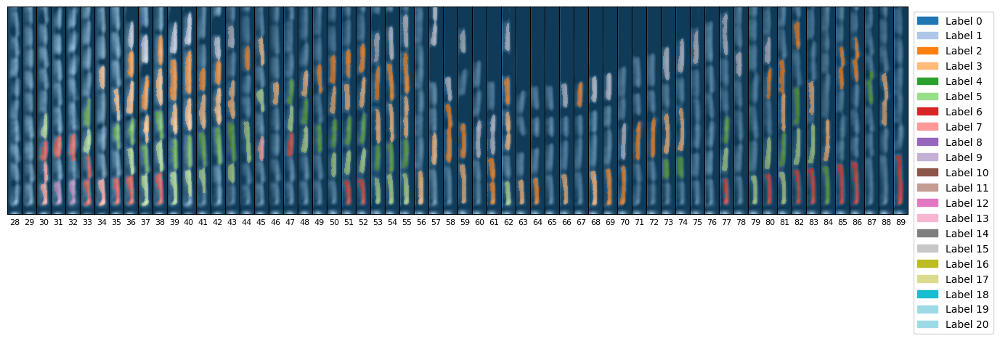

/Users/noravivancogonzalez/code/Image_analysis_copy/mm3_adapted_cell_segmentation.py:102: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  labeled = morphology.remove_small_objects(labeled, min_size=min_object_size)
/Users/noravivancogonzalez/code/Image_analysis_copy/mm3_adapted_cell_segmentation.py:102: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  labeled = morphology.remove_small_objects(labeled, min_size=min_object_size)


merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions


/Users/noravivancogonzalez/code/Image_analysis_copy/mm3_adapted_cell_segmentation.py:102: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  labeled = morphology.remove_small_objects(labeled, min_size=min_object_size)
/Users/noravivancogonzalez/code/Image_analysis_copy/mm3_adapted_cell_segmentation.py:102: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  labeled = morphology.remove_small_objects(labeled, min_size=min_object_size)


merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions


/Users/noravivancogonzalez/code/Image_analysis_copy/mm3_adapted_cell_segmentation.py:102: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  labeled = morphology.remove_small_objects(labeled, min_size=min_object_size)


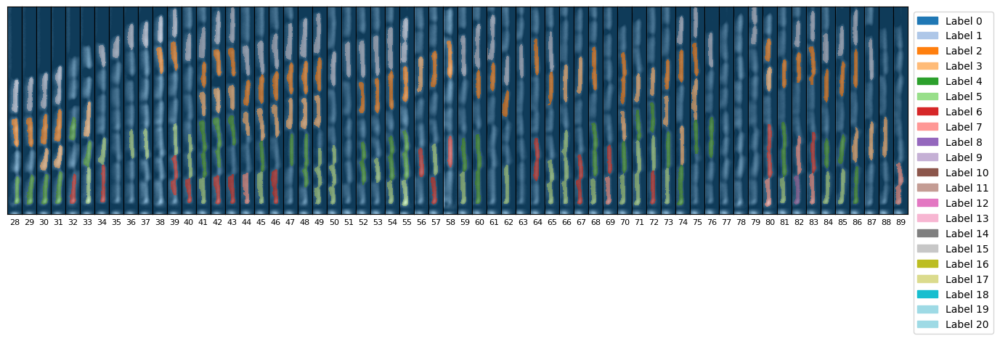

/Users/noravivancogonzalez/code/Image_analysis_copy/mm3_adapted_cell_segmentation.py:102: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  labeled = morphology.remove_small_objects(labeled, min_size=min_object_size)
/Users/noravivancogonzalez/code/Image_analysis_copy/mm3_adapted_cell_segmentation.py:102: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  labeled = morphology.remove_small_objects(labeled, min_size=min_object_size)


merge regions
merge regions


/Users/noravivancogonzalez/code/Image_analysis_copy/mm3_adapted_cell_segmentation.py:102: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  labeled = morphology.remove_small_objects(labeled, min_size=min_object_size)
/Users/noravivancogonzalez/code/Image_analysis_copy/mm3_adapted_cell_segmentation.py:102: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  labeled = morphology.remove_small_objects(labeled, min_size=min_object_size)
/Users/noravivancogonzalez/code/Image_analysis_copy/mm3_adapted_cell_segmentation.py:102: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  labeled = morphology.remove_small_objects(labeled, min_size=min_object_size)
/Users/noravivancogonzalez/code/Image_analysis_copy/mm3_adapted_cell_segmentation.py:102: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use 

merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions


/Users/noravivancogonzalez/code/Image_analysis_copy/mm3_adapted_cell_segmentation.py:102: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  labeled = morphology.remove_small_objects(labeled, min_size=min_object_size)
/Users/noravivancogonzalez/code/Image_analysis_copy/mm3_adapted_cell_segmentation.py:102: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  labeled = morphology.remove_small_objects(labeled, min_size=min_object_size)


merge regions
merge regions
merge regions
merge regions
merge regions
merge regions


/Users/noravivancogonzalez/code/Image_analysis_copy/mm3_adapted_cell_segmentation.py:102: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  labeled = morphology.remove_small_objects(labeled, min_size=min_object_size)
/Users/noravivancogonzalez/code/Image_analysis_copy/mm3_adapted_cell_segmentation.py:102: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  labeled = morphology.remove_small_objects(labeled, min_size=min_object_size)
/Users/noravivancogonzalez/code/Image_analysis_copy/mm3_adapted_cell_segmentation.py:102: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  labeled = morphology.remove_small_objects(labeled, min_size=min_object_size)
/Users/noravivancogonzalez/code/Image_analysis_copy/mm3_adapted_cell_segmentation.py:102: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use 

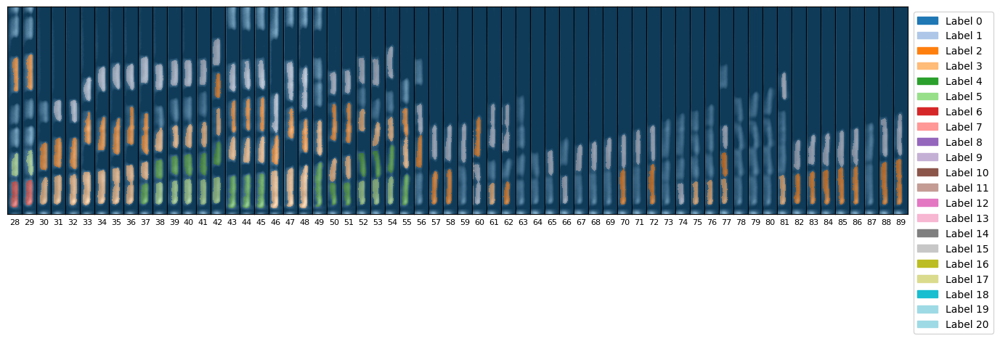

merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions


/Users/noravivancogonzalez/code/Image_analysis_copy/mm3_adapted_cell_segmentation.py:102: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  labeled = morphology.remove_small_objects(labeled, min_size=min_object_size)
/Users/noravivancogonzalez/code/Image_analysis_copy/mm3_adapted_cell_segmentation.py:102: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  labeled = morphology.remove_small_objects(labeled, min_size=min_object_size)


merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions


/Users/noravivancogonzalez/code/Image_analysis_copy/mm3_adapted_cell_segmentation.py:102: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  labeled = morphology.remove_small_objects(labeled, min_size=min_object_size)
/Users/noravivancogonzalez/code/Image_analysis_copy/mm3_adapted_cell_segmentation.py:102: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  labeled = morphology.remove_small_objects(labeled, min_size=min_object_size)
/Users/noravivancogonzalez/code/Image_analysis_copy/mm3_adapted_cell_segmentation.py:102: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  labeled = morphology.remove_small_objects(labeled, min_size=min_object_size)
/Users/noravivancogonzalez/code/Image_analysis_copy/mm3_adapted_cell_segmentation.py:102: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use 

merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions


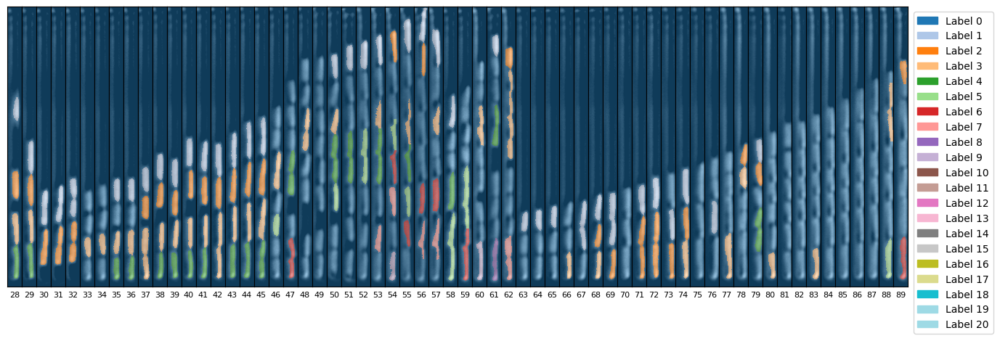

merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions


/Users/noravivancogonzalez/code/Image_analysis_copy/mm3_adapted_cell_segmentation.py:102: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  labeled = morphology.remove_small_objects(labeled, min_size=min_object_size)
/Users/noravivancogonzalez/code/Image_analysis_copy/mm3_adapted_cell_segmentation.py:102: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  labeled = morphology.remove_small_objects(labeled, min_size=min_object_size)


merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions


/Users/noravivancogonzalez/code/Image_analysis_copy/mm3_adapted_cell_segmentation.py:102: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  labeled = morphology.remove_small_objects(labeled, min_size=min_object_size)


merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge 

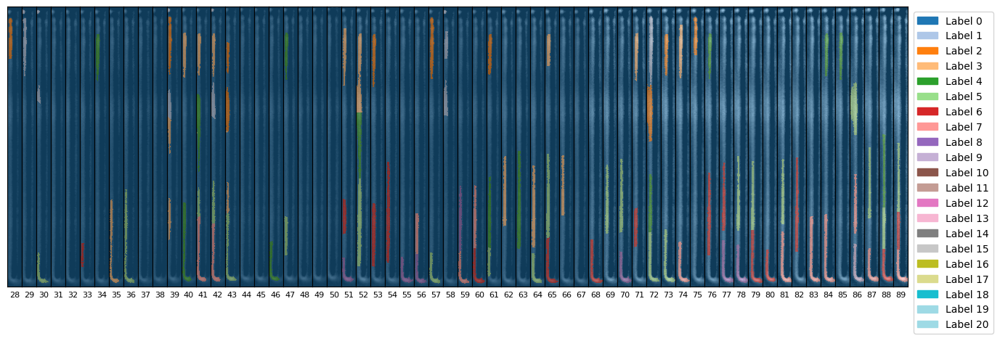

In [22]:
phase_channel = '0'
fluor_channel = '1'
for folder, fov_dict in seg_FOV_dict.items():
    for fov_id in fov_dict.keys():
        ana_peak_ids = fov_dict[fov_id]
        for peak_id in ana_peak_ids:
            path_to_phase_stack = f'/Users/noravivancogonzalez/Documents/DuMM_image_analysis/{folder}/hyperstacked/drift_corrected/rotated/mm_channels/subtracted/subtracted_FOV_{fov_id}_region_{peak_id}_c_{phase_channel}.tif'
            path_to_fluor_stack = f'/Users/noravivancogonzalez/Documents/DuMM_image_analysis/{folder}/hyperstacked/drift_corrected/rotated/mm_channels/subtracted/subtracted_FOV_{fov_id}_region_{peak_id}_c_{fluor_channel}.tif'
            output_path = f'/Users/noravivancogonzalez/Documents/DuMM_image_analysis/{folder}/hyperstacked/drift_corrected/rotated/mm_channels/subtracted/outputs'
            mm3seg.segment_chnl_stack(path_to_phase_stack,
                   output_path,
                   OTSU_threshold=1.5,
                   first_opening=2,
                   distance_threshold=1,
                   second_opening_size=1,
                   min_object_size=5,
                   min_cell_area=200,
				   max_cell_area=600,
                   small_merge_area_threshold=200)
            
            plot_cells.display_segmentation(path_to_phase_stack, mask_path = labeled_stack, start=28, end=90, alpha=0.5)

# Plot identified cells in from start timeframe, until timeframe 20 to get a sense of the success of cell segementation
# In this case only some of the segmentation looks of, a lot of cells are stacked at an angle with overlaps, making it difficult for the
# algorithm to distinguish one cell from another.
mm3seg.display_segmentation(path_to_phase_stack, mask_path = labeled_stack, start=0, end=50, alpha=0.5)

# Apply cell tracking

In [23]:
# select cells starting at t= 28 for fov 005
lineage_FOV_dict = {'DUMM_giTG62_Glucose_012925': 
            {'005': ['445', '900', '1128', '1277', '1887',  '2115', '2344', '2421', '2497']
            }
           }

445
time: 28
time: 29
lookback
lookforward
could not find a match
handle potential division
time: 30
lookback
lookforward
could not find a match
handle potential division
time: 31
handle potential division
time: 32
handle potential division
time: 33
handle potential division
time: 34
handle potential division
time: 35
handle potential division
time: 36
handle potential division
time: 37
handle potential division
time: 38
handle potential division
time: 39
handle potential division
time: 40
handle potential division
time: 41
handle potential division
time: 42
handle potential division
time: 43
time: 44
handle potential division
time: 45
handle potential division
time: 46
handle potential division
time: 47
handle potential division
time: 48
handle potential division
time: 49
handle potential division
time: 50
time: 51
time: 52
time: 53
time: 54
time: 55
time: 56
handle potential division
time: 57
handle potential division
time: 58
handle potential division
time: 59
handle potential divis

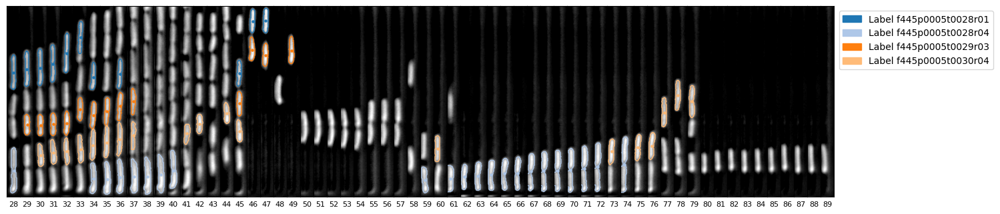

/var/folders/hj/bk95lprn3zb88y7bqhjh9j5m0000gr/T/ipykernel_43730/437291104.py:25: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  all_cells_pd = pd.concat([all_cells_pd, cells_pd])


900
time: 28
time: 29
handle potential division
time: 30
handle potential division
time: 31
handle potential division
time: 32
handle potential division
time: 33
handle potential division
time: 34
handle potential division
time: 35
handle potential division
time: 36
handle potential division
time: 37
handle potential division
time: 38
handle potential division
time: 39
handle potential division
time: 40
handle potential division
time: 41
handle potential division
time: 42
handle potential division
time: 43
handle potential division
time: 44
handle potential division
time: 45
handle potential division
time: 46
handle potential division
time: 47
handle potential division
time: 48
handle potential division
time: 49
handle potential division
time: 50
handle potential division
time: 51
handle potential division
time: 52
handle potential division
time: 53
time: 54
time: 55
time: 56
time: 57
handle potential division
time: 58
handle potential division
time: 59
handle potential division
time: 

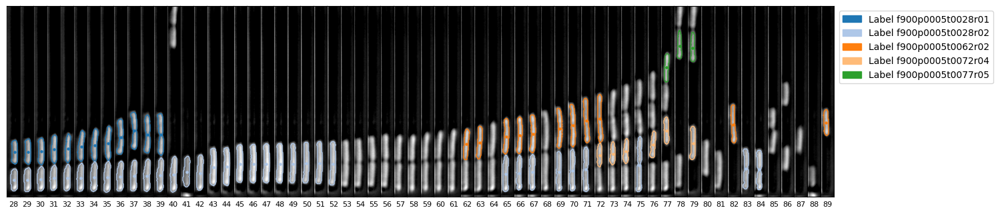

1128
time: 28
time: 29
handle potential division
time: 30
handle potential division
time: 31
handle potential division
time: 32
handle potential division
time: 33
handle potential division
time: 34
handle potential division
time: 35
handle potential division
time: 36
lookback
lookforward
could not find a match
handle potential division
time: 37
lookback
lookforward
could not find a match
handle potential division
time: 38
handle potential division
time: 39
handle potential division
time: 40
handle potential division
time: 41
handle potential division
time: 42
handle potential division
time: 43
handle potential division
time: 44
handle potential division
time: 45
handle potential division
time: 46
handle potential division
time: 47
handle potential division
time: 48
handle potential division
time: 49
handle potential division
time: 50
handle potential division
time: 51
handle potential division
time: 52
handle potential division
daughters and parent names assigned
time: 53
handle potent

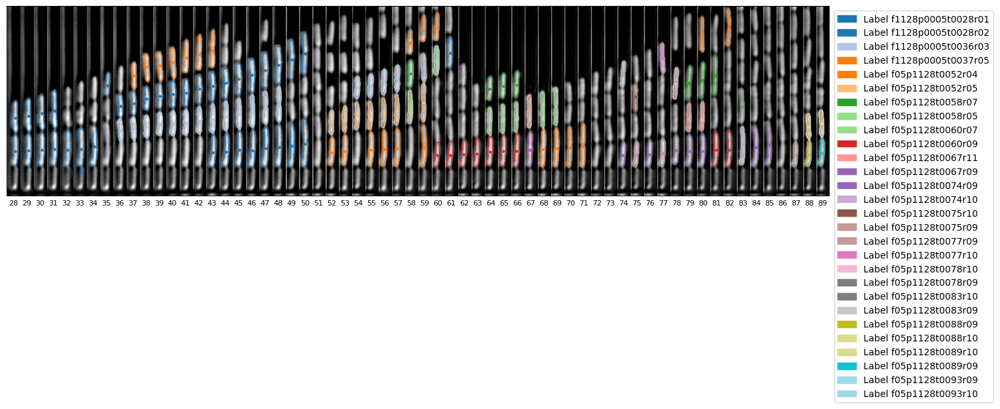

1277
time: 28
time: 29
handle potential division
time: 30
handle potential division
time: 31
handle potential division
time: 32
handle potential division
time: 33
handle potential division
time: 34
handle potential division
time: 35
handle potential division
time: 36
handle potential division
time: 37
handle potential division
time: 38
handle potential division
time: 39
handle potential division
time: 40
handle potential division
time: 41
handle potential division
time: 42
handle potential division
time: 43
handle potential division
time: 44
handle potential division
time: 45
handle potential division
time: 46
handle potential division
time: 47
handle potential division
time: 48
handle potential division
time: 49
handle potential division
time: 50
handle potential division
time: 51
handle potential division
time: 52
handle potential division
time: 53
handle potential division
time: 54
time: 55
time: 56
time: 57
time: 58
time: 59
handle potential division
time: 60
handle potential divis

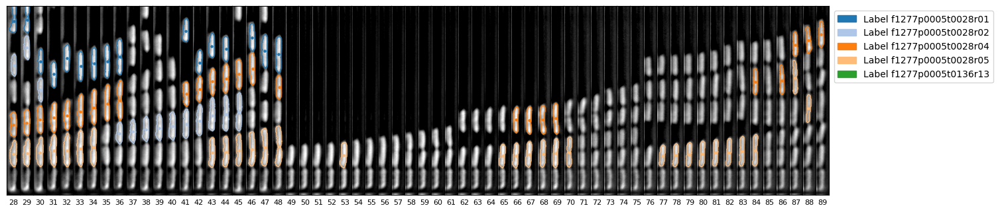

1887
time: 28
time: 29
handle potential division
time: 30
lookback
lookforward
could not find a match
handle potential division
time: 31
lookback
lookforward
could not find a match
handle potential division
time: 32
handle potential division
time: 33
handle potential division
time: 34
handle potential division
time: 35
handle potential division
time: 36
handle potential division
time: 37
handle potential division
time: 38
handle potential division
time: 39
handle potential division
time: 40
handle potential division
time: 41
handle potential division
time: 42
handle potential division
time: 43
handle potential division
time: 44
handle potential division
time: 45
handle potential division
time: 46
handle potential division
time: 47
handle potential division
time: 48
handle potential division
time: 49
handle potential division
time: 50
handle potential division
time: 51
handle potential division
time: 52
handle potential division
time: 53
handle potential division
time: 54
handle potenti

KeyError: 2

In [24]:
phase_channel = '0'
fluor_channel = '1'
all_cells_pd = pd.DataFrame(columns = ['cell_id', 'time_index', 'is_active', 'daughters', 'parent', 'labels',
       'bboxes', 'areas_(pxls^2)', 'lengths_(pxls)', 'widths_(pxls)',
       'orientations', 'centroids', 'fl_area_avgs', 'experiment', 'FOV', 'peak_id'])
for folder, fov_dict in lineage_FOV_dict.items():
    for fov_id in fov_dict.keys():
        ana_peak_ids = fov_dict[fov_id]
        for peak_id in ana_peak_ids:
            print(peak_id)
            path_to_phase_stack = f'/Users/noravivancogonzalez/Documents/DuMM_image_analysis/{folder}/hyperstacked/drift_corrected/rotated/mm_channels/subtracted/subtracted_FOV_{fov_id}_region_{peak_id}_c_{phase_channel}.tif'
            path_to_fluor_stack = f'/Users/noravivancogonzalez/Documents/DuMM_image_analysis/{folder}/hyperstacked/drift_corrected/rotated/mm_channels/subtracted/subtracted_FOV_{fov_id}_region_{peak_id}_c_{fluor_channel}.tif'
            labeled_stack = f'/Users/noravivancogonzalez/Documents/DuMM_image_analysis/{folder}/hyperstacked/drift_corrected/rotated/mm_channels/subtracted/mm3_segmented_subtracted_FOV_{fov_id}_region_{peak_id}_c_{phase_channel}.tif'
            cells_dict = mm3track.make_lineage_chnl_stack(labeled_stack = labeled_stack, 
                                              fov_id = int(fov_id), 
                                              peak_id = int(peak_id), 
                                              pxl2um = 1,
                                              start_frame = 28)
            mm3track.find_cell_intensities(path_to_fluor_stack, labeled_stack, cells_dict, midline=False, start_frame = 28)
            plot_cells.display_cells_from_dict(path_to_phase_stack, cells_dict, start=28, end=90)
            cells_pd = mm3track.cells2df(cells_dict, num_time_frames = 5)
            cells_pd['experiment'] = folder
            cells_pd['FOV'] = fov_id
            cells_pd['peak_id'] = peak_id
            all_cells_pd = pd.concat([all_cells_pd, cells_pd])

# Markus suggested the following to improve cell tracking
2/11/25
fit a curve to centroids of a lineage, skipping frames were regions are not detected
Then go back to the frames where there should be cells and do a watershed to see if i find a cell in that broader area
Markus also noticed that the cells that seem to have a septum and are about to divide are not getting tracked.
Are these areas getting tossed due to my size exclusion algorithm?
Markus thinks that it might be that there's a dip in detection at the septum so no centroid would be found there. Is there a way I can detect this dip in detection and use it to indicate a division? Is it that the centroids of the daughter cells end up being too far?

In [55]:
#Test out with just one peak
phase_channel = '0'
fluor_channel = '1'


# select cells starting at t= 28 for fov 005
seg_FOV_dict = {'DUMM_giTG62_Glucose_012925': 
            {'005': ['900']
            }
           }

merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions


/Users/noravivancogonzalez/code/Image_analysis_copy/mm3_adapted_cell_segmentation.py:102: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  labeled = morphology.remove_small_objects(labeled, min_size=min_object_size)
/Users/noravivancogonzalez/code/Image_analysis_copy/mm3_adapted_cell_segmentation.py:102: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  labeled = morphology.remove_small_objects(labeled, min_size=min_object_size)
/Users/noravivancogonzalez/code/Image_analysis_copy/mm3_adapted_cell_segmentation.py:102: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  labeled = morphology.remove_small_objects(labeled, min_size=min_object_size)
/Users/noravivancogonzalez/code/Image_analysis_copy/mm3_adapted_cell_segmentation.py:102: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use 

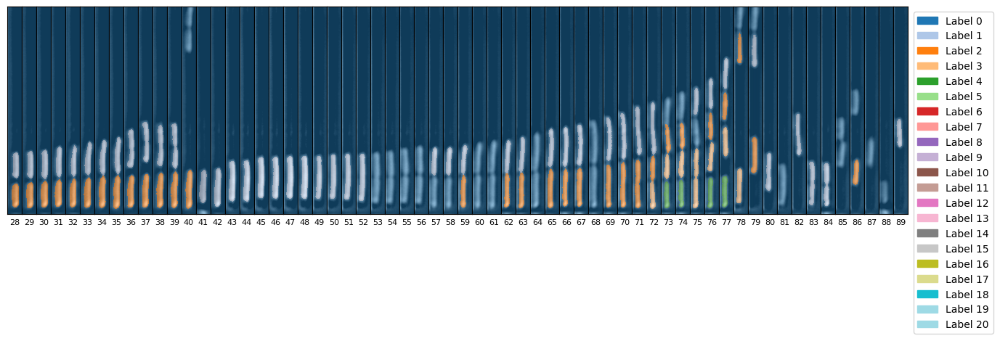

In [57]:
for folder, fov_dict in seg_FOV_dict.items():
    for fov_id in fov_dict.keys():
        ana_peak_ids = fov_dict[fov_id]
        for peak_id in ana_peak_ids:
            path_to_phase_stack = f'/Users/noravivancogonzalez/Documents/DuMM_image_analysis/{folder}/hyperstacked/drift_corrected/rotated/mm_channels/subtracted/subtracted_FOV_{fov_id}_region_{peak_id}_c_{phase_channel}.tif'
            path_to_fluor_stack = f'/Users/noravivancogonzalez/Documents/DuMM_image_analysis/{folder}/hyperstacked/drift_corrected/rotated/mm_channels/subtracted/subtracted_FOV_{fov_id}_region_{peak_id}_c_{fluor_channel}.tif'
            output_path = f'/Users/noravivancogonzalez/Documents/DuMM_image_analysis/{folder}/hyperstacked/drift_corrected/rotated/mm_channels/subtracted/outputs'
            mm3seg.segment_chnl_stack(path_to_phase_stack,
                   output_path,
                   OTSU_threshold=1.5,
                   first_opening=2,
                   distance_threshold=1,
                   second_opening_size=1,
                   min_object_size=5,
                   min_cell_area=200,
				   max_cell_area=600,
                   small_merge_area_threshold=200)
            labeled_stack = f'/Users/noravivancogonzalez/Documents/DuMM_image_analysis/{folder}/hyperstacked/drift_corrected/rotated/mm_channels/subtracted/mm3_segmented_subtracted_FOV_{fov_id}_region_{peak_id}_c_{phase_channel}.tif'
            plot_cells.display_segmentation(path_to_phase_stack, mask_path = labeled_stack, start=28, end=90, alpha=0.5)

merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions


/Users/noravivancogonzalez/code/Image_analysis_copy/mm3_adapted_cell_segmentation.py:102: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  labeled = morphology.remove_small_objects(labeled, min_size=min_object_size)
/Users/noravivancogonzalez/code/Image_analysis_copy/mm3_adapted_cell_segmentation.py:102: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  labeled = morphology.remove_small_objects(labeled, min_size=min_object_size)
/Users/noravivancogonzalez/code/Image_analysis_copy/mm3_adapted_cell_segmentation.py:102: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  labeled = morphology.remove_small_objects(labeled, min_size=min_object_size)
/Users/noravivancogonzalez/code/Image_analysis_copy/mm3_adapted_cell_segmentation.py:102: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use 

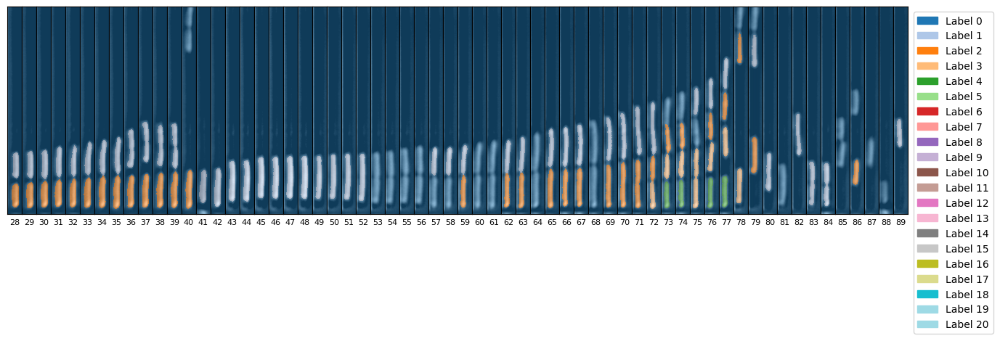

In [58]:
for folder, fov_dict in seg_FOV_dict.items():
    for fov_id in fov_dict.keys():
        ana_peak_ids = fov_dict[fov_id]
        for peak_id in ana_peak_ids:
            path_to_phase_stack = f'/Users/noravivancogonzalez/Documents/DuMM_image_analysis/{folder}/hyperstacked/drift_corrected/rotated/mm_channels/subtracted/subtracted_FOV_{fov_id}_region_{peak_id}_c_{phase_channel}.tif'
            path_to_fluor_stack = f'/Users/noravivancogonzalez/Documents/DuMM_image_analysis/{folder}/hyperstacked/drift_corrected/rotated/mm_channels/subtracted/subtracted_FOV_{fov_id}_region_{peak_id}_c_{fluor_channel}.tif'
            output_path = f'/Users/noravivancogonzalez/Documents/DuMM_image_analysis/{folder}/hyperstacked/drift_corrected/rotated/mm_channels/subtracted/outputs'
            mm3seg.segment_chnl_stack(path_to_phase_stack,
                   output_path,
                   OTSU_threshold=1.5,
                   first_opening=2,
                   distance_threshold=1,
                   second_opening_size=1,
                   min_object_size=5,
                   min_cell_area=200,
				   max_cell_area=800,
                   small_merge_area_threshold=200)
            labeled_stack = f'/Users/noravivancogonzalez/Documents/DuMM_image_analysis/{folder}/hyperstacked/drift_corrected/rotated/mm_channels/subtracted/mm3_segmented_subtracted_FOV_{fov_id}_region_{peak_id}_c_{phase_channel}.tif'
            plot_cells.display_segmentation(path_to_phase_stack, mask_path = labeled_stack, start=28, end=90, alpha=0.5)

merge regions
merge regions
merge regions
merge regions


/Users/noravivancogonzalez/code/Image_analysis_copy/mm3_adapted_cell_segmentation.py:102: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  labeled = morphology.remove_small_objects(labeled, min_size=min_object_size)
/Users/noravivancogonzalez/code/Image_analysis_copy/mm3_adapted_cell_segmentation.py:102: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  labeled = morphology.remove_small_objects(labeled, min_size=min_object_size)
/Users/noravivancogonzalez/code/Image_analysis_copy/mm3_adapted_cell_segmentation.py:102: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  labeled = morphology.remove_small_objects(labeled, min_size=min_object_size)
/Users/noravivancogonzalez/code/Image_analysis_copy/mm3_adapted_cell_segmentation.py:102: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use 

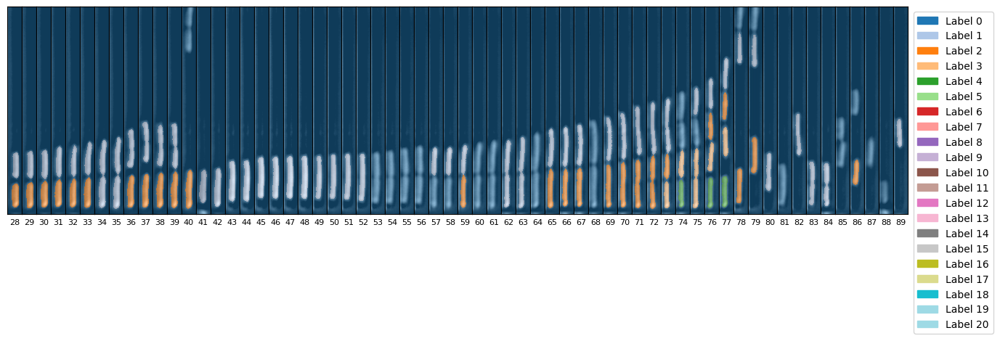

In [63]:
for folder, fov_dict in seg_FOV_dict.items():
    for fov_id in fov_dict.keys():
        ana_peak_ids = fov_dict[fov_id]
        for peak_id in ana_peak_ids:
            path_to_phase_stack = f'/Users/noravivancogonzalez/Documents/DuMM_image_analysis/{folder}/hyperstacked/drift_corrected/rotated/mm_channels/subtracted/subtracted_FOV_{fov_id}_region_{peak_id}_c_{phase_channel}.tif'
            path_to_fluor_stack = f'/Users/noravivancogonzalez/Documents/DuMM_image_analysis/{folder}/hyperstacked/drift_corrected/rotated/mm_channels/subtracted/subtracted_FOV_{fov_id}_region_{peak_id}_c_{fluor_channel}.tif'
            output_path = f'/Users/noravivancogonzalez/Documents/DuMM_image_analysis/{folder}/hyperstacked/drift_corrected/rotated/mm_channels/subtracted/outputs'
            mm3seg.segment_chnl_stack(path_to_phase_stack,
                   output_path,
                   OTSU_threshold=1.5,
                   first_opening=1,
                   distance_threshold=1,
                   second_opening_size=1,
                   min_object_size=5,
                   min_cell_area=200,
				   max_cell_area=900,
                   small_merge_area_threshold=200)
            labeled_stack = f'/Users/noravivancogonzalez/Documents/DuMM_image_analysis/{folder}/hyperstacked/drift_corrected/rotated/mm_channels/subtracted/mm3_segmented_subtracted_FOV_{fov_id}_region_{peak_id}_c_{phase_channel}.tif'
            plot_cells.display_segmentation(path_to_phase_stack, mask_path = labeled_stack, start=28, end=90, alpha=0.5)

In [25]:
all_cells_pd['peak_id'].unique()

array(['445', '900', '1128', '1277'], dtype=object)

In [ ]:
# select cells starting at t= 28 for fov 005
lineage_FOV_dict = {'DUMM_giTG62_Glucose_012925': 
            {'005': ['445', '900', '1128', '1277', '1887',  '2115', '2344', '2421', '2497']
            }
           }

In [2]:
phase_channel = '0'
fluor_channel = '1'
folder = 'DUMM_giTG62_Glucose_012925'
fov_id = '005'
peak_id = '900'

In [3]:
path_to_phase_stack = f'/Users/noravivancogonzalez/Documents/DuMM_image_analysis/{folder}/hyperstacked/drift_corrected/rotated/mm_channels/subtracted/subtracted_FOV_{fov_id}_region_{peak_id}_c_{phase_channel}.tif'
path_to_fluor_stack = f'/Users/noravivancogonzalez/Documents/DuMM_image_analysis/{folder}/hyperstacked/drift_corrected/rotated/mm_channels/subtracted/subtracted_FOV_{fov_id}_region_{peak_id}_c_{fluor_channel}.tif'
output_path = f'/Users/noravivancogonzalez/Documents/DuMM_image_analysis/{folder}/hyperstacked/drift_corrected/rotated/mm_channels/subtracted/outputs'
labeled_stack = f'/Users/noravivancogonzalez/Documents/DuMM_image_analysis/{folder}/hyperstacked/drift_corrected/rotated/mm_channels/subtracted/mm3_segmented_subtracted_FOV_{fov_id}_region_{peak_id}_c_{phase_channel}.tif'

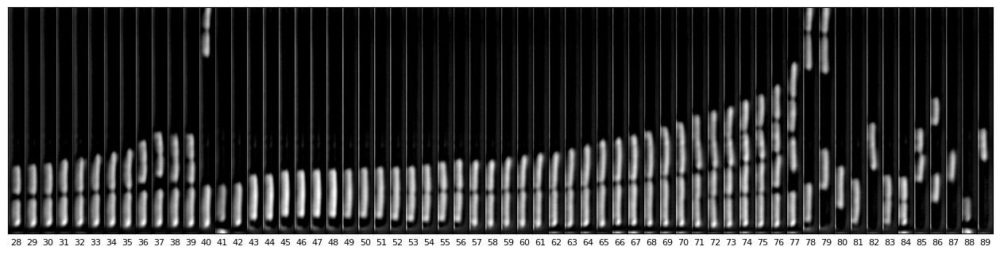

In [5]:
plot_cells.display_stack(path_to_phase_stack, start=28, end=90)

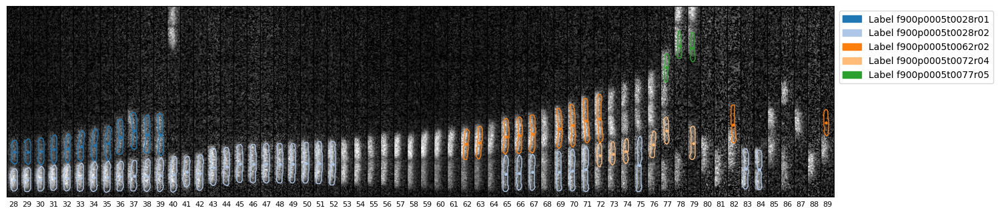

In [5]:
plot_cells.display_cells_from_dict(path_to_fluor_stack, cells_dict, start=28, end=90)

# Analysis of identified cells

In [26]:
def cell_color_dict(cells_df):
    color_dict = {}
    unique_cell_ids = cells_df['cell_id'].unique()
    total_number_labels = len(unique_cell_ids)
    number_of_colors_needed = max(20, total_number_labels)
    # Get a colormap with  distinct colors, for potential cell labels
    cmap = plt.cm.get_cmap('tab20', number_of_colors_needed)
    # Create a dictionary mapping integers to hex color codes
    for color_i, cell_id in enumerate(unique_cell_ids):
        color = cmap(color_i)[:3]  # Extract RGB values
        color_dict[cell_id] = color
    return color_dict

In [30]:
color_dict = cell_color_dict(all_cells_pd)

/var/folders/hj/bk95lprn3zb88y7bqhjh9j5m0000gr/T/ipykernel_43730/419849173.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('tab20', number_of_colors_needed)


In [36]:
color_dict 

{'f445p0005t0028r01': (0.12156862745098039,
  0.4666666666666667,
  0.7058823529411765),
 'f445p0005t0028r04': (0.12156862745098039,
  0.4666666666666667,
  0.7058823529411765),
 'f445p0005t0029r03': (0.6823529411764706,
  0.7803921568627451,
  0.9098039215686274),
 'f445p0005t0030r04': (1.0, 0.4980392156862745, 0.054901960784313725),
 'f900p0005t0028r01': (1.0, 0.7333333333333333, 0.47058823529411764),
 'f900p0005t0028r02': (0.17254901960784313,
  0.6274509803921569,
  0.17254901960784313),
 'f900p0005t0062r02': (0.596078431372549,
  0.8745098039215686,
  0.5411764705882353),
 'f900p0005t0072r04': (0.8392156862745098,
  0.15294117647058825,
  0.1568627450980392),
 'f05p1128t0052r04': (1.0, 0.596078431372549, 0.5882352941176471),
 'f05p1128t0052r05': (0.5803921568627451,
  0.403921568627451,
  0.7411764705882353),
 'f05p1128t0058r05': (0.7725490196078432,
  0.6901960784313725,
  0.8352941176470589),
 'f05p1128t0058r07': (0.5490196078431373,
  0.33725490196078434,
  0.29411764705882354)

Text(0.5, 28.999999999999986, 'Time frames')

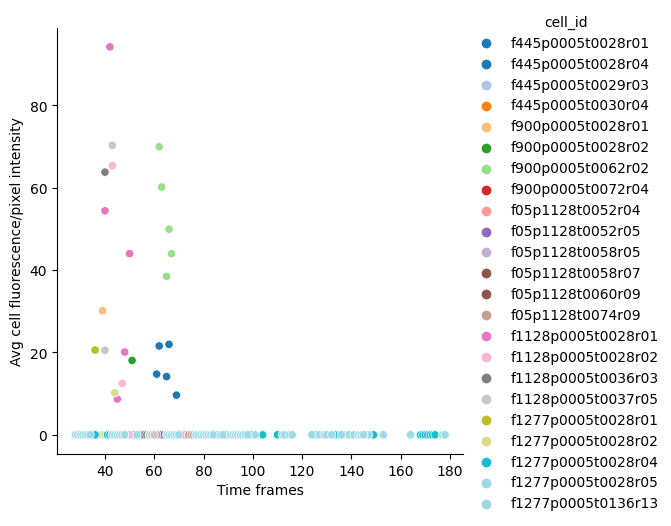

In [31]:
sns.relplot(data=all_cells_pd, x= 'time_index', y= 'fl_area_avgs', hue= 'cell_id', palette = color_dict)

sns.despine()

plt.ylabel('Avg cell fluorescence/pixel intensity')
plt.xlabel('Time frames')

Text(0.5, 28.999999999999986, 'Time frames')

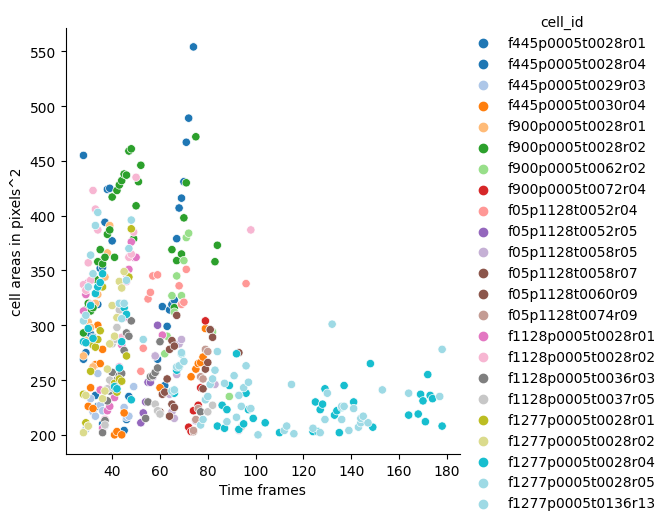

In [33]:
sns.relplot(data=all_cells_pd, x= 'time_index', y= 'areas_(pxls^2)', hue= 'cell_id', palette = color_dict)

sns.despine()

plt.ylabel('cell areas in pixels^2')
plt.xlabel('Time frames')

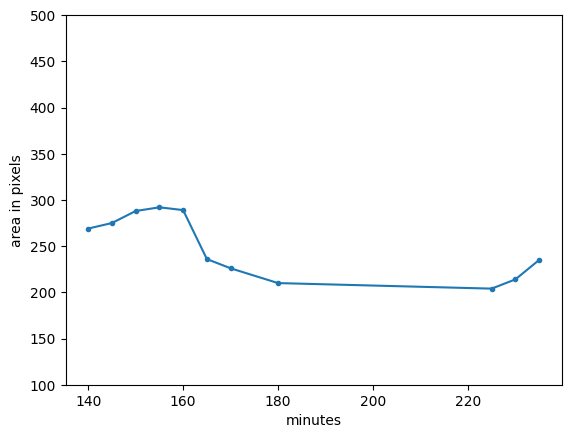

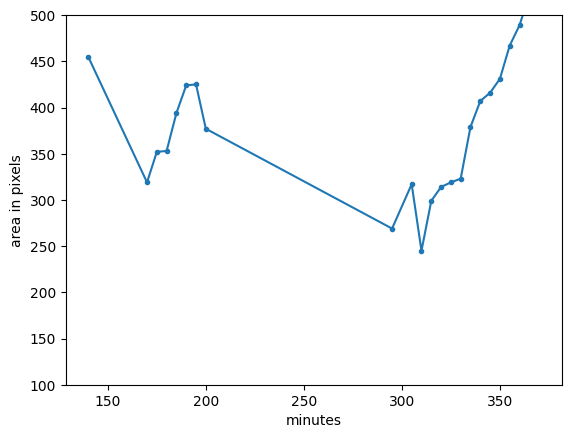

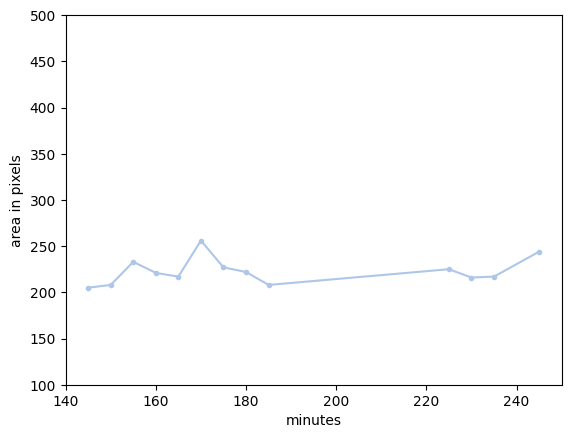

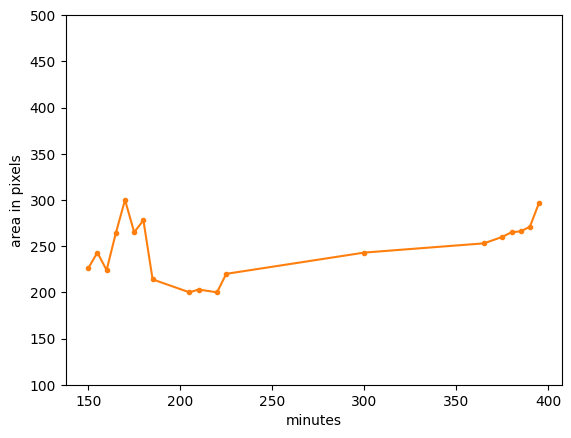

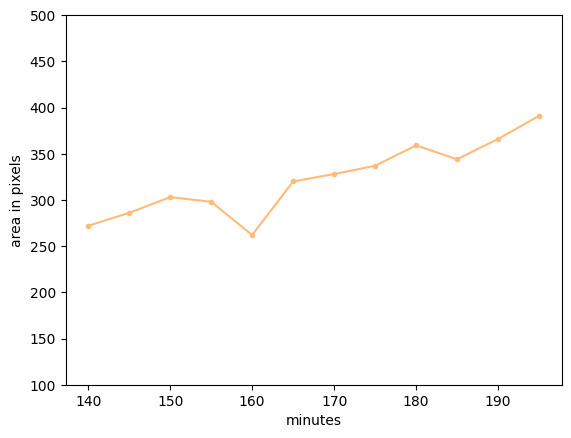

...

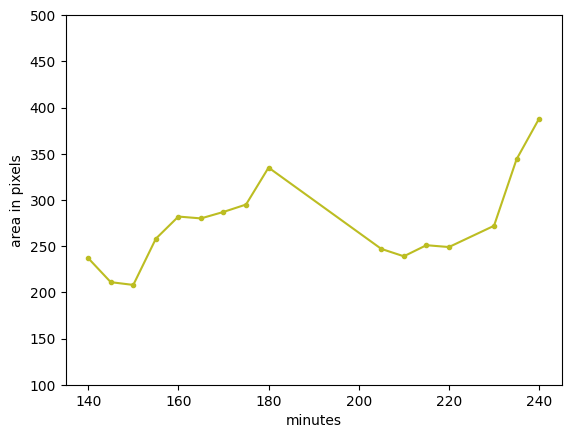

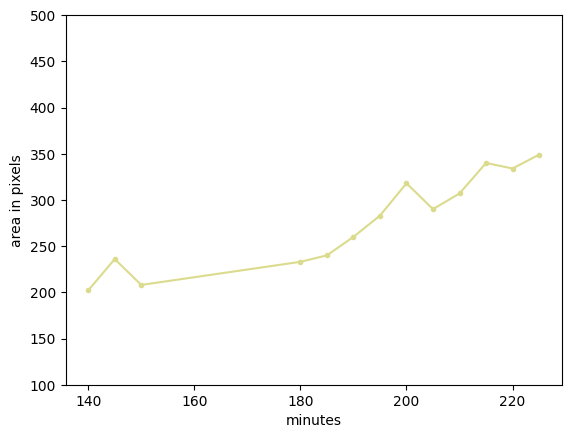

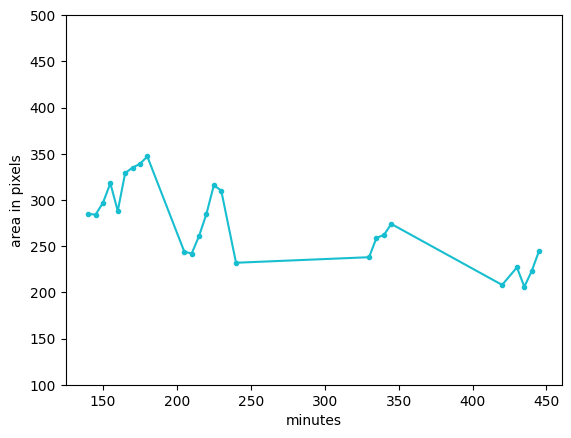

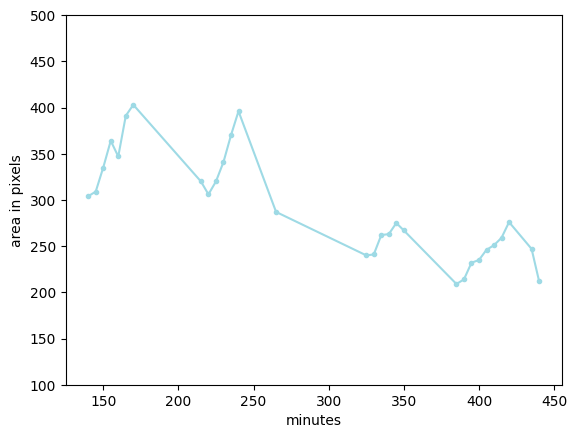

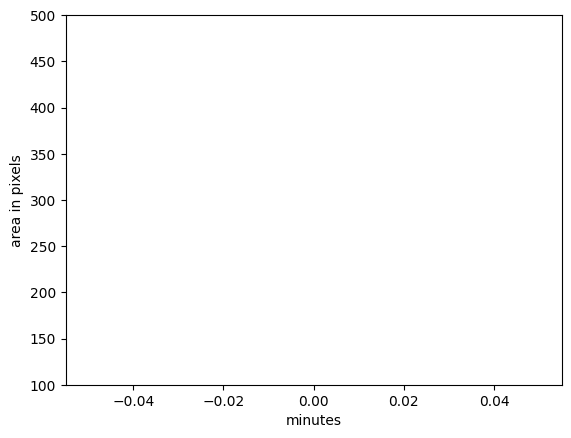

In [48]:
for cell_id, color in color_dict.items():
    cell_df = all_cells_pd[(all_cells_pd['cell_id'] == cell_id) & (all_cells_pd['time_index']< 90)]
    plt.plot(cell_df['time_index']*5, cell_df['areas_(pxls^2)'], marker='.', color = color) 
    plt.xlabel('minutes')
    plt.ylim(100, 500)
    plt.ylabel('area in pixels')
    plt.show()

In [34]:
all_cells_pd['cell_id'].unique()

array(['f445p0005t0028r01', 'f445p0005t0028r04', 'f445p0005t0029r03',
       'f445p0005t0030r04', 'f900p0005t0028r01', 'f900p0005t0028r02',
       'f900p0005t0062r02', 'f900p0005t0072r04', 'f05p1128t0052r04',
       'f05p1128t0052r05', 'f05p1128t0058r05', 'f05p1128t0058r07',
       'f05p1128t0060r09', 'f05p1128t0074r09', 'f1128p0005t0028r01',
       'f1128p0005t0028r02', 'f1128p0005t0036r03', 'f1128p0005t0037r05',
       'f1277p0005t0028r01', 'f1277p0005t0028r02', 'f1277p0005t0028r04',
       'f1277p0005t0028r05', 'f1277p0005t0136r13'], dtype=object)

In [45]:
folder = 'DUMM_giTG62_Glucose_012925'
fov_id = '005'
peak_id = '2421'
phase_channel = '0'

In [56]:
fov5_pd = all_cells_pd[(all_cells_pd['fov'] == 5)& (all_cells_pd['peak'] == 2421)]

In [57]:
fov5_pd

,cell_id,fov,peak,birth_label,parent,daughters,birth_time_index,time_index,labels,areas_(pxls^2),...,widths_(pxls),orientations,centroids,generation time_(min),fl_area_avgs,bb_xLeft,bb_yTop,bb_width,bb_height,experiment
6,f05p2421t0026r01,5,2421,1,None,None,26,26,1,193.0,...,6.576915,1.482478,"(114.66839378238342, 11.300518134715025)",None,37.533679,100,7,129,16,DUMM_giTG62_Glucose_012925
6,f05p2421t0026r01,5,2421,1,None,None,26,27,1,204.0,...,6.576915,1.459512,"(115.8578431372549, 11.132352941176471)",None,35.25,100,7,131,16,DUMM_giTG62_Glucose_012925
6,f05p2421t0026r01,5,2421,1,None,None,26,28,1,157.0,...,5.5,1.487889,"(113.7515923566879, 11.286624203821656)",None,30.796178,101,8,127,16,DUMM_giTG62_Glucose_012925
6,f05p2421t0026r01,5,2421,1,None,None,26,29,1,156.0,...,6.041381,1.490431,"(110.17307692307692, 11.525641025641026)",None,34.49359,97,8,124,16,DUMM_giTG62_Glucose_012925
6,f05p2421t0026r01,5,2421,1,None,None,26,30,1,185.0,...,6.535534,1.511101,"(105.32432432432432, 11.367567567567567)",None,28.345946,91,7,121,16,DUMM_giTG62_Glucose_012925
6,f05p2421t0026r01,5,2421,1,None,None,26,31,1,194.0,...,6.576915,1.533493,"(96.85051546391753, 10.742268041237113)",None,26.92268,82,6,113,15,DUMM_giTG62_Glucose_012925
6,f05p2421t0026r01,5,2421,1,None,None,26,32,1,162.0,...,6.082763,1.53808,"(85.80246913580247, 11.234567901234568)",None,25.425926,72,8,102,15,DUMM_giTG62_Glucose_012925
6,f05p2421t0026r01,5,2421,1,None,None,26,36,2,191.0,...,5.590891,-1.524457,"(77.06806282722513, 11.115183246073299)",None,31.973822,61,8,94,15,DUMM_giTG62_Glucose_012925
6,f05p2421t0026r01,5,2421,1,None,None,26,41,2,203.0,...,6.035534,1.549466,"(93.66009852216749, 10.187192118226601)",None,36.53202,76,6,112,14,DUMM_giTG62_Glucose_012925
11,f05p2421t0036r01,5,2421,1,None,None,36,36,1,242.0,...,7.071068,1.565589,"(41.29752066115702, 9.830578512396695)",None,28.016529,24,5,61,14,DUMM_giTG62_Glucose_012925


In [39]:
cell_df = all_cells_pd[all_cells_pd['cell_id'].isin(['f05p2421t0074r05', 'f05p2421t0078r05'])] 

In [49]:
path_to_phase_stack = f'/Users/noravivancogonzalez/Documents/DuMM_image_analysis/{folder}/hyperstacked/drift_corrected/rotated/mm_channels/subtracted/subtracted_FOV_{fov_id}_region_{peak_id}_c_{phase_channel}.tif'
path_to_fluor_stack = f'/Users/noravivancogonzalez/Documents/DuMM_image_analysis/{folder}/hyperstacked/drift_corrected/rotated/mm_channels/subtracted/subtracted_FOV_{fov_id}_region_{peak_id}_c_{fluor_channel}.tif'

In [ ]:
cell_df = all_cells_pd[all_cells_pd['cell_id'].isin(['f05p2421t0074r05', 'f05p2421t0078r05'])] 

# Determine parameters for mm3seg.segment_chnl_stack

In [2]:
#Test out with just one peak
phase_channel = '0'
fluor_channel = '1'


# select cells starting at t= 28 for fov 005
seg_FOV_dict = {'DUMM_giTG62_Glucose_012925': 
            {'005': ['900']
            }
           }

merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions
merge regions


/Users/noravivancogonzalez/code/Image_analysis_copy/mm3_adapted_cell_segmentation.py:102: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  labeled = morphology.remove_small_objects(labeled, min_size=min_object_size)
/Users/noravivancogonzalez/code/Image_analysis_copy/mm3_adapted_cell_segmentation.py:102: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  labeled = morphology.remove_small_objects(labeled, min_size=min_object_size)
/Users/noravivancogonzalez/code/Image_analysis_copy/mm3_adapted_cell_segmentation.py:102: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  labeled = morphology.remove_small_objects(labeled, min_size=min_object_size)
/Users/noravivancogonzalez/code/Image_analysis_copy/mm3_adapted_cell_segmentation.py:102: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use 

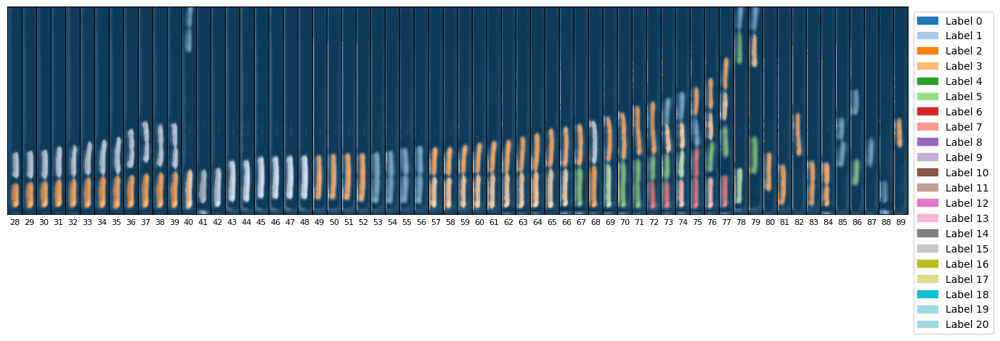

In [3]:
for folder, fov_dict in seg_FOV_dict.items():
    for fov_id in fov_dict.keys():
        ana_peak_ids = fov_dict[fov_id]
        for peak_id in ana_peak_ids:
            path_to_phase_stack = f'/Users/noravivancogonzalez/Documents/DuMM_image_analysis/{folder}/hyperstacked/drift_corrected/rotated/mm_channels/subtracted/subtracted_FOV_{fov_id}_region_{peak_id}_c_{phase_channel}.tif'
            path_to_fluor_stack = f'/Users/noravivancogonzalez/Documents/DuMM_image_analysis/{folder}/hyperstacked/drift_corrected/rotated/mm_channels/subtracted/subtracted_FOV_{fov_id}_region_{peak_id}_c_{fluor_channel}.tif'
            output_path = f'/Users/noravivancogonzalez/Documents/DuMM_image_analysis/{folder}/hyperstacked/drift_corrected/rotated/mm_channels/subtracted/outputs'
            mm3seg.segment_chnl_stack(path_to_phase_stack,
                   output_path,
                   OTSU_threshold=1.5,
                   first_opening=2,
                   distance_threshold=1,
                   second_opening_size=1,
                   min_object_size=5,
                   min_cell_area=200,
				   max_cell_area=600,
                   small_merge_area_threshold=200)
            labeled_stack = f'/Users/noravivancogonzalez/Documents/DuMM_image_analysis/{folder}/hyperstacked/drift_corrected/rotated/mm_channels/subtracted/mm3_segmented_subtracted_FOV_{fov_id}_region_{peak_id}_c_{phase_channel}.tif'
            plot_cells.display_segmentation(path_to_phase_stack, mask_path = labeled_stack, start=28, end=90, alpha=0.5)

In [64]:
fov_id = '005'
peak_id = '900'
phase_channel = '0'
fluor_channel = '1'
path_to_phase_stack = f'/Users/noravivancogonzalez/Documents/DuMM_image_analysis/{folder}/hyperstacked/drift_corrected/rotated/mm_channels/subtracted/subtracted_FOV_{fov_id}_region_{peak_id}_c_{phase_channel}.tif'

In [68]:
image_stack = tifffile.imread(path_to_phase_stack)
image = image_stack[54]

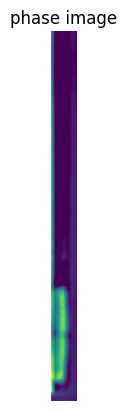

In [69]:
plt.figure()
plt.imshow(image)
plt.title('phase image')
plt.axis('off')  # Hide axis labels
plt.draw()

In [70]:
from skimage.filters import threshold_otsu

In [71]:
import skimage.segmentation as segmentation

In [72]:
from skimage import morphology

In [73]:
import scipy.ndimage as ndi

In [ ]:
OTSU_threshold=1.5,
                   first_opening=2,
                   distance_threshold=1,
                   second_opening_size=1,

In [109]:
OTSU_threshold=2
first_opening = 2
distance_threshold=1
second_opening_size=1
min_object_size=5

In [110]:
thresh = threshold_otsu(image)  # finds optimal OTSU threshhold value
threshholded = image > OTSU_threshold * thresh  # will create binary image

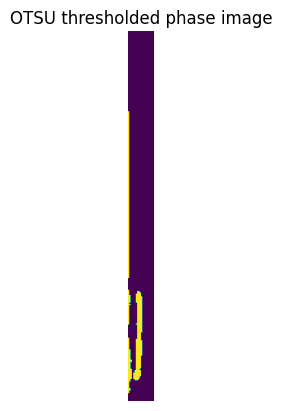

In [111]:
plt.figure()
plt.imshow(threshholded)
plt.title('OTSU thresholded phase image')
plt.axis('off')  # Hide axis labels
plt.draw()

In [112]:
# Opening = erosion then dialation.
# opening smooths images, breaks isthmuses, and eliminates protrusions.
# "opens" dark gaps between bright features.
# Create a diagonal line-shaped footprint
diagonal_footprint = np.zeros((first_opening, first_opening))
np.fill_diagonal(diagonal_footprint, 1)

morph = morphology.binary_opening(threshholded, diagonal_footprint)

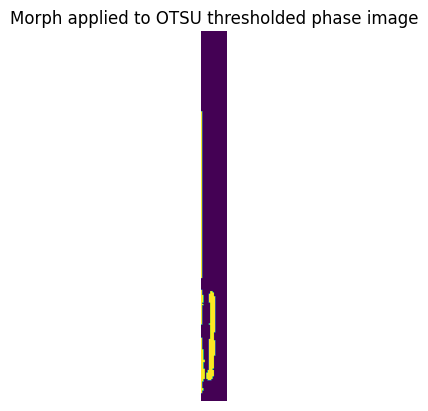

In [113]:
plt.figure()
plt.imshow(morph)
plt.title('Morph applied to OTSU thresholded phase image')
plt.axis('off')  # Hide axis labels
plt.draw()

In [114]:
distance = ndi.distance_transform_edt(morph)
# threshold distance image

distance = ndi.distance_transform_edt(morph)

distance_thresh = distance >= distance_threshold

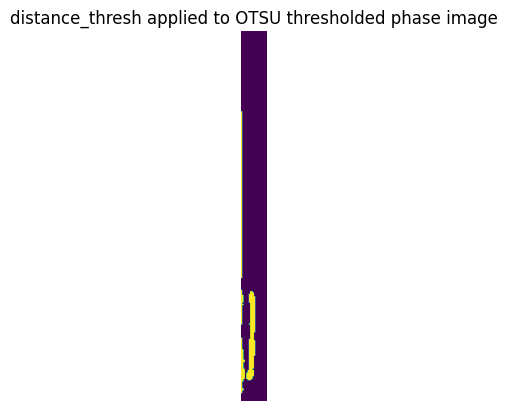

In [115]:
plt.figure()
plt.imshow(distance_thresh)
plt.title('distance_thresh applied to OTSU thresholded phase image')
plt.axis('off')  # Hide axis labels
plt.draw()

In [116]:
distance_opened = morphology.binary_opening(distance_thresh, morphology.disk(second_opening_size))


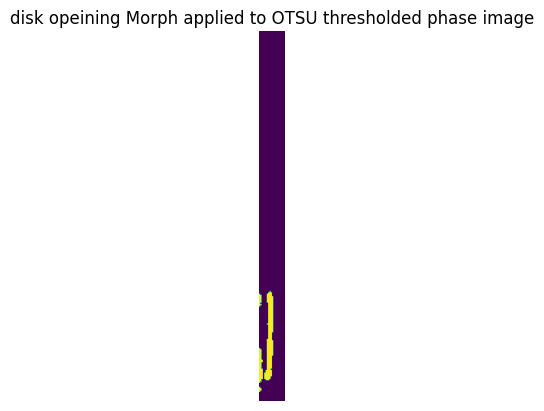

In [117]:
plt.figure()
plt.imshow(distance_opened)
plt.title('disk opeining Morph applied to OTSU thresholded phase image')
plt.axis('off')  # Hide axis labels
plt.draw()

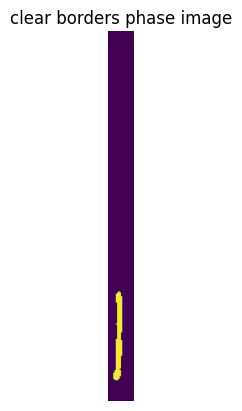

In [118]:
# remove artifacts connected to image border
cleared = segmentation.clear_border(labels = distance_opened, buffer_size = 1)
plt.figure()
plt.imshow(cleared)
plt.title('clear borders phase image')
plt.axis('off')  # Hide axis labels
plt.draw()

In [108]:
labeled, label_num = morphology.label(cleared, connectivity=1, return_num=True)
if label_num > 1:
    labeled = morphology.remove_small_objects(labeled, min_size=min_object_size)

In [ ]:
plt.figure()
plt.imshow(labeled)
plt.title('labeled image')
plt.axis('off')  # Hide axis labels
plt.draw()

In [ ]:
# relabel now that small objects and labels on edges have been cleared
markers = morphology.label(labeled, connectivity=1)
plt.figure()
plt.imshow(markers)
plt.title('relabeled phase image')
plt.axis('off')  # Hide axis labels
plt.draw()

In [ ]:
# the binary image for the watershed, which uses the unmodified OTSU threshold
threshholded_watershed = threshholded
plt.figure()
plt.imshow(threshholded_watershed)
plt.title('relabeled phase image')
plt.axis('off')  # Hide axis labels
plt.draw()

In [ ]:
# set anything outside of OTSU threshold to -1 so it will not be labeled
markers[threshholded_watershed == 0] = -1
# here is the main algorithm
plt.figure()
plt.imshow(markers)
plt.title('relabeled phase image')
plt.axis('off')  # Hide axis labels
plt.draw()

In [ ]:
labeled_image = segmentation.random_walker(-1 * image, markers)
plt.figure()
plt.imshow(labeled_image)
plt.title('random walker image')
plt.axis('off')  # Hide axis labels
plt.draw()

In [ ]:
# put negative values back to zero for proper image
labeled_image[labeled_image == -1] = 0
plt.figure()
plt.imshow(labeled_image)
plt.title('relabel zero values in image')
plt.axis('off')  # Hide axis labels
plt.draw()